<a href="https://colab.research.google.com/github/MrigeeshAshwin/DCGANs/blob/main/GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import warnings
import torch
import torchvision
from torch import nn
import os
import requests
import zipfile
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import time

In [2]:
def download_extract(data_url, data_dir):
    if not os.path.exists(data_dir):
        os.makedirs(data_dir)
    zip_path = os.path.join(data_dir, 'pokemon.zip')
    if not os.path.exists(zip_path):
        response = requests.get(data_url)
        with open(zip_path, 'wb') as f:
            f.write(response.content)
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(data_dir)
    return data_dir

In [3]:
data_url = 'http://d2l-data.s3-accelerate.amazonaws.com/pokemon.zip'
data_dir = download_extract(data_url, 'data')

In [4]:
pokemon = torchvision.datasets.ImageFolder(data_dir)

In [5]:
batch_size = 256
transformer = torchvision.transforms.Compose([
    torchvision.transforms.Resize((64, 64)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5,), (0.5,))
])
pokemon.transform = transformer

In [6]:
data_iter = DataLoader(pokemon, batch_size=batch_size, shuffle=True, num_workers=4)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


In [7]:
def show_images(images, num_rows, num_cols, scale=1.5):
    figsize = (num_cols * scale, num_rows * scale)
    _, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    for i in range(num_rows):
        for j in range(num_cols):
            axes[i, j].imshow(images[i * num_cols + j])
            axes[i, j].axes.get_xaxis().set_visible(False)
            axes[i, j].axes.get_yaxis().set_visible(False)
    return axes

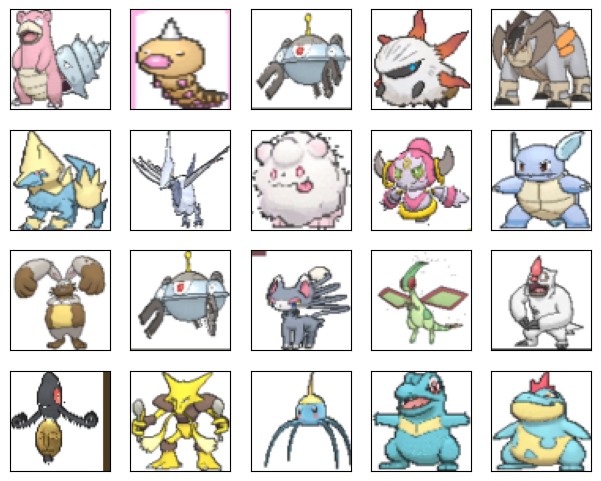

In [8]:
warnings.filterwarnings('ignore')
for X, y in data_iter:
    imgs = X[:20].permute(0, 2, 3, 1) / 2 + 0.5
    show_images(imgs, 4, 5)
    break

In [9]:
class G_block(nn.Module):
    def __init__(self, out_channels, in_channels=3, kernel_size=4, strides=2, padding=1):
        super(G_block, self).__init__()
        self.conv2d_trans = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, strides, padding, bias=False)
        self.batch_norm = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()

    def forward(self, X):
        return self.activation(self.batch_norm(self.conv2d_trans(X)))

In [10]:
x = torch.zeros((2, 3, 16, 16))
g_blk = G_block(20)
print(g_blk(x).shape)

torch.Size([2, 20, 32, 32])


In [11]:
x = torch.zeros((2, 3, 1, 1))
g_blk = G_block(20, strides=1, padding=0)
print(g_blk(x).shape)

torch.Size([2, 20, 4, 4])


In [12]:
n_G = 64
net_G = nn.Sequential(
    G_block(in_channels=100, out_channels=n_G * 8, strides=1, padding=0),  # Output: (64 * 8, 4, 4)
    G_block(in_channels=n_G * 8, out_channels=n_G * 4),                   # Output: (64 * 4, 8, 8)
    G_block(in_channels=n_G * 4, out_channels=n_G * 2),                   # Output: (64 * 2, 16, 16)
    G_block(in_channels=n_G * 2, out_channels=n_G),                       # Output: (64, 32, 32)
    nn.ConvTranspose2d(in_channels=n_G, out_channels=3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)

In [13]:
class D_block(nn.Module):
    def __init__(self, out_channels, in_channels, kernel_size=4, strides=2, padding=1):
        super(D_block, self).__init__()
        self.conv2d = nn.Conv2d(in_channels, out_channels, kernel_size, strides, padding, bias=False)
        self.batch_norm = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)

    def forward(self, X):
        return self.activation(self.batch_norm(self.conv2d(X)))

In [14]:
n_D = 64
net_D = nn.Sequential(
    D_block(in_channels=3, out_channels=n_D),             # Output: (64, 32, 32)
    D_block(in_channels=n_D, out_channels=n_D * 2),       # Output: (64 * 2, 16, 16)
    D_block(in_channels=n_D * 2, out_channels=n_D * 4),   # Output: (64 * 4, 8, 8)
    D_block(in_channels=n_D * 4, out_channels=n_D * 8),   # Output: (64 * 8, 4, 4)
    nn.Conv2d(in_channels=n_D * 8, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False)
)

In [15]:
def init_weights(m):
    if type(m) == nn.Conv2d or type(m) == nn.ConvTranspose2d or type(m) == nn.BatchNorm2d:
        nn.init.normal_(m.weight, 0.0, 0.02)

In [16]:
net_G.apply(init_weights)
net_D.apply(init_weights)

Sequential(
  (0): D_block(
    (conv2d): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batch_norm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (1): D_block(
    (conv2d): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batch_norm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (2): D_block(
    (conv2d): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batch_norm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (activation): LeakyReLU(negative_slope=0.2)
  )
  (3): D_block(
    (conv2d): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (batch_norm): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 

In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
net_D, net_G = net_D.to(device), net_G.to(device)
latent_dim, lr, num_epochs = 100, 0.005, 20
trainer_hp = {'lr': lr, 'betas': [0.5, 0.999]}
trainer_D = torch.optim.Adam(net_D.parameters(), **trainer_hp)
trainer_G = torch.optim.Adam(net_G.parameters(), **trainer_hp)
loss = nn.BCEWithLogitsLoss()

In [18]:
def update_D(X, Z, net_D, net_G, loss, trainer_D):
    batch_size = X.shape[0]
    ones = torch.ones(batch_size, device=device)
    zeros = torch.zeros(batch_size, device=device)
    real_Y = net_D(X).view(-1)
    fake_X = net_G(Z)
    fake_Y = net_D(fake_X.detach()).view(-1)
    loss_D = (loss(real_Y, ones) + loss(fake_Y, zeros)) / 2
    trainer_D.zero_grad()
    loss_D.backward()
    trainer_D.step()
    return loss_D.item()

In [19]:
def update_G(Z, net_D, net_G, loss, trainer_G):
    batch_size = Z.shape[0]
    ones = torch.ones(batch_size, device=device)
    fake_X = net_G(Z)
    fake_Y = net_D(fake_X).view(-1)
    loss_G = loss(fake_Y, ones)
    trainer_G.zero_grad()
    loss_G.backward()
    trainer_G.step()
    return loss_G.item()

In [20]:
def train(net_D, net_G, data_iter, num_epochs, lr, latent_dim):
    for epoch in range(1, num_epochs + 1):
        start_time = time.time()
        loss_D_sum, loss_G_sum, n = 0.0, 0.0, 0
        for X, _ in data_iter:
            batch_size = X.shape[0]
            Z = torch.normal(0, 1, size=(batch_size, latent_dim, 1, 1)).to(device)
            X = X.to(device)
            loss_D_sum += update_D(X, Z, net_D, net_G, loss, trainer_D)
            loss_G_sum += update_G(Z, net_D, net_G, loss, trainer_G)
            n += batch_size

        end_time = time.time()
        print(f'epoch {epoch}, loss_D {loss_D_sum / n:.3f}, loss_G {loss_G_sum / n:.3f}, time {end_time - start_time:.2f} sec')

        # Display generated images
        with torch.no_grad():
            Z = torch.normal(0, 1, size=(21, latent_dim, 1, 1), device=device)
            fake_X = net_G(Z).permute(0, 2, 3, 1).cpu() / 2 + 0.5
            fake_X = fake_X.clamp(0, 1)
            show_images(fake_X, 3, 7)

epoch 1, loss_D 0.002, loss_G 0.005, time 54.13 sec
epoch 2, loss_D 0.002, loss_G 0.009, time 55.08 sec
epoch 3, loss_D 0.002, loss_G 0.014, time 56.18 sec
epoch 4, loss_D 0.002, loss_G 0.011, time 56.14 sec
epoch 5, loss_D 0.002, loss_G 0.011, time 55.82 sec
epoch 6, loss_D 0.002, loss_G 0.013, time 55.97 sec
epoch 7, loss_D 0.001, loss_G 0.016, time 56.04 sec
epoch 8, loss_D 0.001, loss_G 0.018, time 55.89 sec
epoch 9, loss_D 0.001, loss_G 0.020, time 56.20 sec
epoch 10, loss_D 0.001, loss_G 0.022, time 56.55 sec
epoch 11, loss_D 0.000, loss_G 0.023, time 56.18 sec
epoch 12, loss_D 0.000, loss_G 0.025, time 57.99 sec
epoch 13, loss_D 0.000, loss_G 0.027, time 56.00 sec
epoch 14, loss_D 0.001, loss_G 0.026, time 56.08 sec
epoch 15, loss_D 0.000, loss_G 0.025, time 55.91 sec
epoch 16, loss_D 0.000, loss_G 0.030, time 56.06 sec
epoch 17, loss_D 0.001, loss_G 0.028, time 56.26 sec
epoch 18, loss_D 0.000, loss_G 0.025, time 56.19 sec
epoch 19, loss_D 0.000, loss_G 0.029, time 56.11 sec
ep

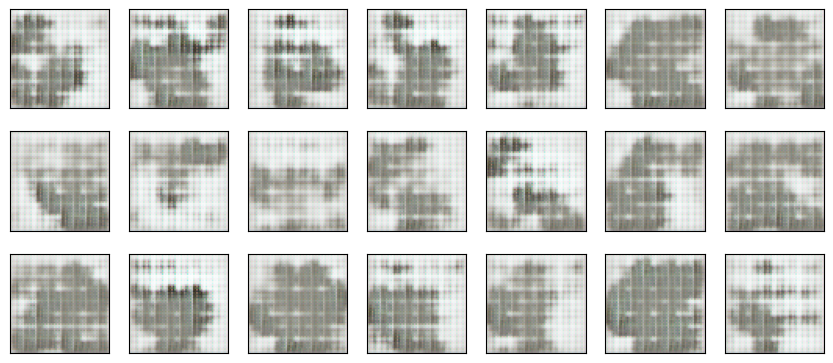

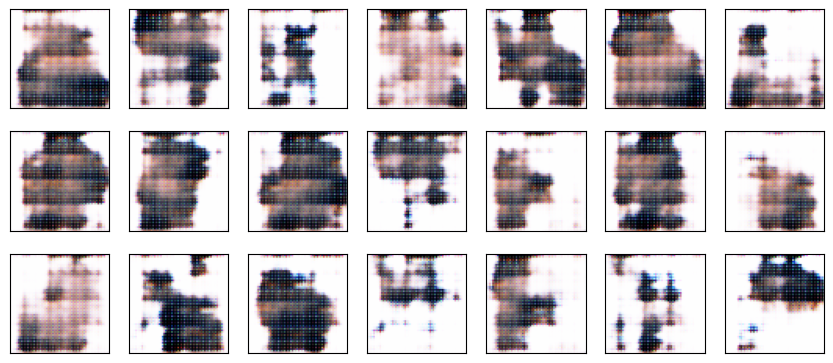

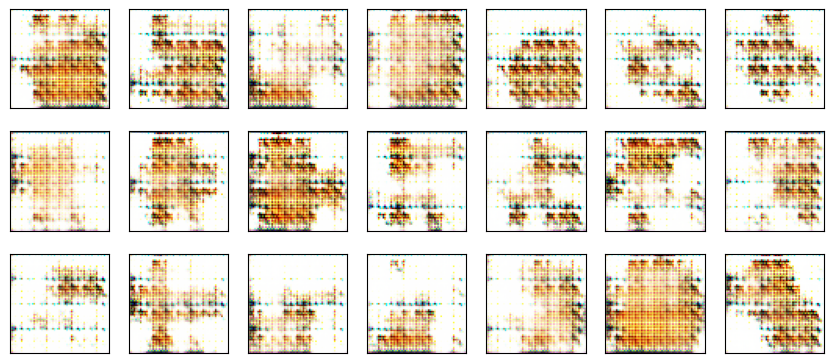

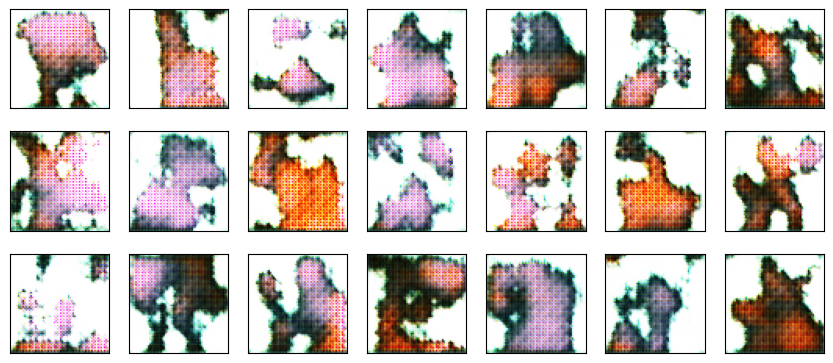

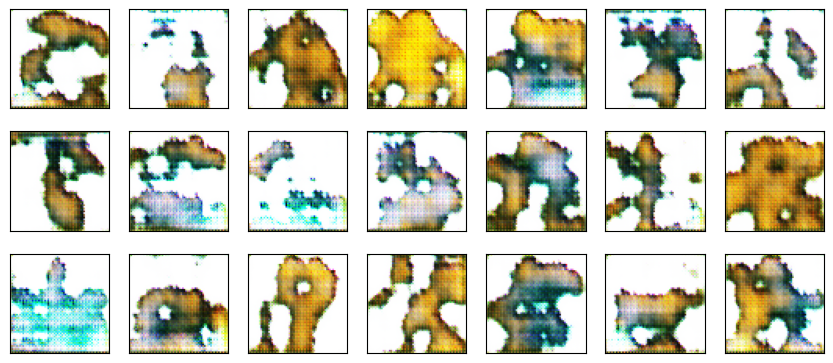

...

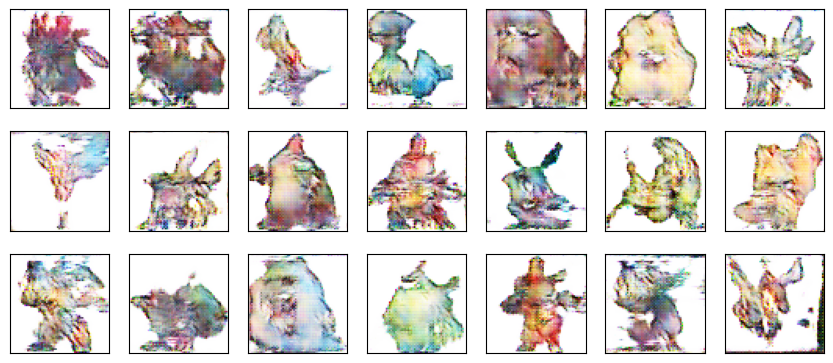

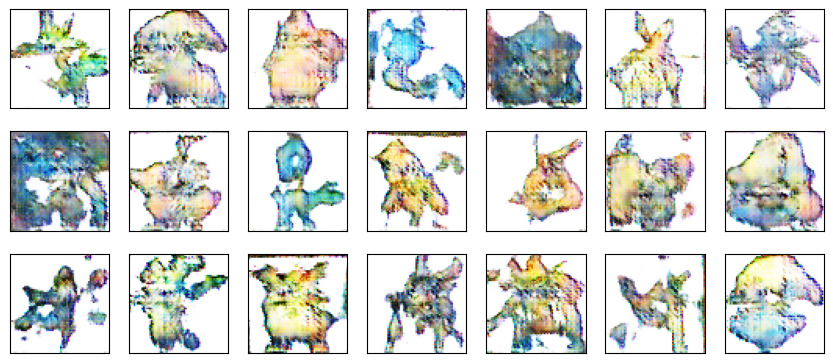

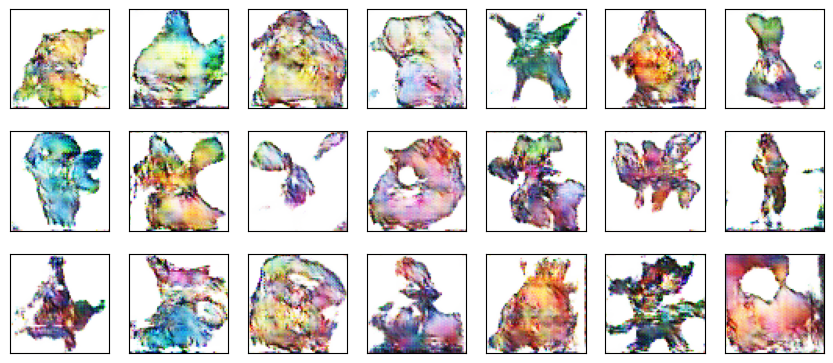

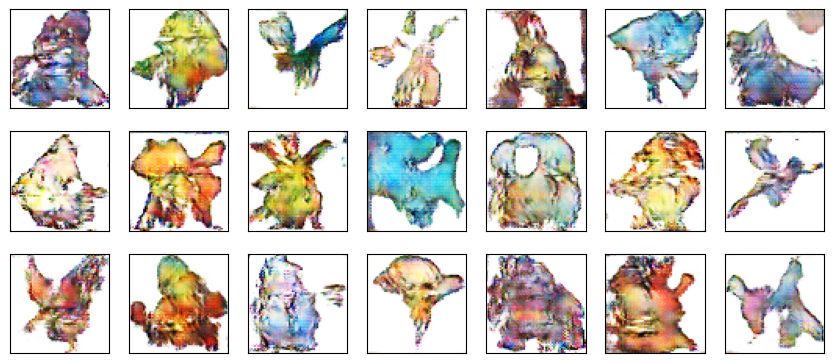

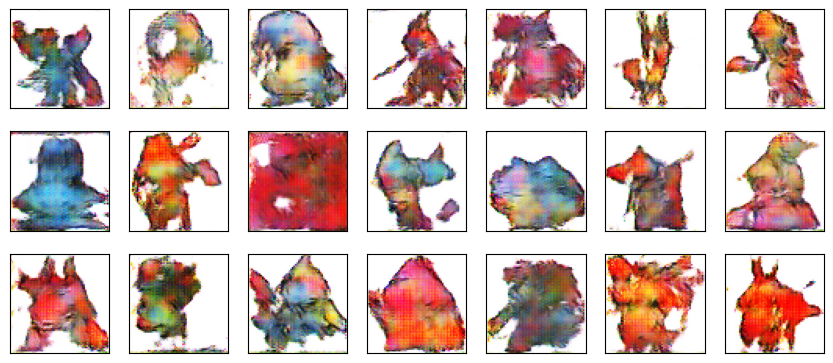

In [21]:
train(net_D, net_G, data_iter, num_epochs, lr, latent_dim)